# Import

In this notebook, I preprocess the sound textures from McDermott and Simoncelli (2011).

In [1]:
from scipy.io import wavfile
import numpy as np
import matplotlib.pyplot as plt
import os
import IPython  # to play audio
import glob
import torch
from functools import partial

from torch import nn, optim
from torch.nn import functional as F
from scipy.signal import spectrogram
import torchvision
import torchvision.transforms as TV
import torchaudio.transforms as AV


import matplotlib as mpl
mpl.rcParams.update({'font.size':         24,
                     'axes.linewidth':    3,
                     'xtick.major.size':  5,
                     'xtick.major.width': 2,
                     'ytick.major.size':  5,
                     'ytick.major.width': 2,
                     'axes.spines.right': False,
                     'axes.spines.top':   False,
                     'font.sans-serif':  "Arial",
                     'font.family':      "sans-serif",
                    })

########## Checks if path exists, if not then creates directory ##########
def check_path(basepath, path):
    if path in basepath:
        return basepath
    elif not os.path.exists(os.path.join(basepath, path)):
        os.makedirs(os.path.join(basepath, path))
        print('Added Directory:'+ os.path.join(basepath, path))
        return os.path.join(basepath, path)
    else:
        return os.path.join(basepath, path)

rootdir = os.path.expanduser('~/Research/PredAudio')
# Set up partial functions for directory managing
join = partial(os.path.join,rootdir)
checkDir = partial(check_path,rootdir)
FigurePath = checkDir('Figures')

savefigs=False



# Natural Sounds Dataset Curation

In [220]:
data_path = os.path.expanduser('~/Research/PredAudio/naturalsounds165/')
data_path2 = os.path.expanduser('~/Research/PredAudio/McDermott_Simoncelli_2011_168_Sound_Textures/')

In [227]:
data_files1 = sorted(glob.glob(os.path.join(data_path,'*.wav')))
data_files2 = sorted(glob.glob(os.path.join(data_path2,'*.wav')))

In [230]:
samplerate1, data_temp = wavfile.read(data_files[0])
samplerate2, data_temp = wavfile.read(data_files[-1])


In [247]:

data1 = np.zeros((len(data_files1),samplerate1*2))
for n, d in enumerate(data_files1):
    samplerate, data_temp = wavfile.read(d)
    data1[n] = data_temp.copy()

data2 = np.zeros((len(data_files2),samplerate2*5))
for n, d in enumerate(data_files2):
    samplerate, data_temp = wavfile.read(d)
    data2[n] = data_temp[:samplerate2*5].copy()
    

(129, 520)


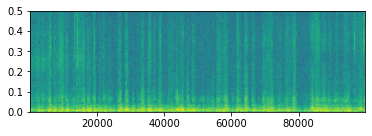

In [248]:
nf,nt = (128,512)
f_vals, t_vals, spec = spectrogram(data2[n], noverlap=nf//2)
spec = np.log(1e-9 + spec)
print(spec.shape)
plt.imshow(spec, aspect=sample_length, origin='lower', extent=(t_vals[0], t_vals[-1], f_vals[0], f_vals[-1]))

In [255]:
nf,nt = (128,512)
resize = transforms.Resize((nf,nt))

data_spec1 = np.zeros((data1.shape[0],1,nf,nt))
for n in range(data_spec1.shape[0]):
    f_vals, t_vals, spec = spectrogram(data1[n], noverlap=nf//2)
    spec = np.log(1e-9 + spec)
    spec2 = resize(torch.Tensor(spec).unsqueeze(0))
    data_spec1[n,:] = spec2.numpy() 
    
data_spec2 = np.zeros((data2.shape[0],1,nf,nt))
for n in range(data_spec2.shape[0]):
    f_vals, t_vals, spec = spectrogram(data2[n], noverlap=nf//2)
    spec = np.log(1e-9 + spec)
    spec2 = resize(torch.Tensor(spec).unsqueeze(0))
    data_spec2[n,:] = spec2.numpy() 
    
all_spec = np.concatenate((data_spec1,data_spec2),axis=0)

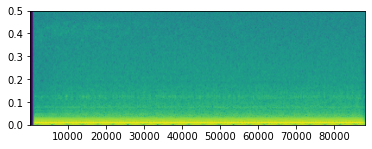

In [271]:
plt.imshow(all_spec[3,0], aspect=sample_length, origin='lower', extent=(t_vals[0], t_vals[-1], f_vals[0], f_vals[-1]))

In [264]:
from sklearn.model_selection import train_test_split

spec_train, spec_test = train_test_split(all_spec, train_size=256, random_state=1)

In [265]:
spec_train.shape, spec_test.shape

((256, 1, 128, 512), (77, 1, 128, 512))

In [266]:
np.save('Specs.npy',all_spec)
np.save('Specs_train.npy',spec_train)
np.save('Specs_test.npy',spec_test)


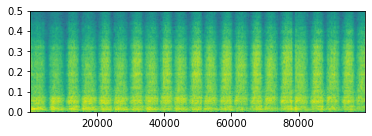

In [267]:
plt.imshow(spec_train[7,0], aspect=sample_length, origin='lower', extent=(t_vals[0], t_vals[-1], f_vals[0], f_vals[-1]))

In [14]:
rootdir

'/home/eabe/Research/PredAudio'

# MNIST Dataset

In [2]:
import pandas as pd

In [3]:
data_path = os.path.expanduser('~/Research/Github/free-spoken-digit-dataset/recordings/')
data_files1 = sorted(glob.glob(os.path.join(data_path,'*.wav')))


In [4]:
digits, speaker, inds = [], [], []
for n, file in enumerate(data_files1):
    digits.append(int(os.path.basename(data_files1[n][:-4]).split('_')[0]))
    speaker.append(os.path.basename(data_files1[n][:-4]).split('_')[1])
    inds.append(int(os.path.basename(data_files1[n][:-4]).split('_')[2]))

In [5]:
labels_df = pd.DataFrame({'digits':digits, 'speaker':speaker, 'inds':inds})
# labels_df.to_csv(os.path.join(rootdir,'labels.csv'))

In [6]:
samplerate1, data_temp = wavfile.read(data_files1[0])
samplerate1

8000

In [7]:
##### Clip recordings to 9000 samples to get same length #####

t_length=9000
data1 = np.zeros((len(data_files1),t_length))
for n, d in enumerate(data_files1):
    samplerate, data_temp = wavfile.read(d)
    data1[n,:len(data_temp)] = data_temp[:t_length].copy()

In [8]:
##### Take subset of data ##### 

sub0 = [file for file in data_files1 if '_0.' in file]

data1 = np.zeros((len(sub0)),dtype='object')
for n, d in enumerate(sub0):
    samplerate, data_temp = wavfile.read(d)
    data1[n] = data_temp.copy()

In [11]:
xsteps = np.arange(9000)

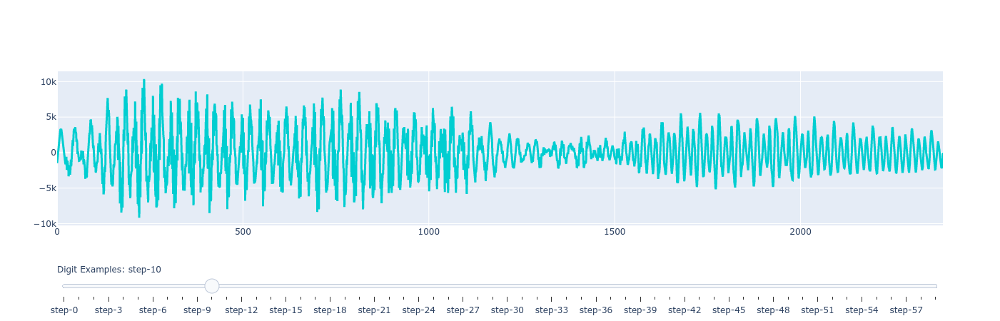

In [16]:
import plotly.graph_objects as go

# Create figure
fig = go.Figure()

# Add traces, one for each slider step
for step in np.arange(len(data1)):
    fig.add_trace(
        go.Scatter(
            visible=False,
            line=dict(color="#00CED1", width=3),
            name="0 example # " + str(step),
            x=xsteps,
            y=data1[step]))

# Make 10th trace visible
fig.data[0].visible = True

# Create and add slider
steps = []
for i in range(len(fig.data)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
              {"title": "0 Digit Example: " + str(i)}],  # layout attribute
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=10,
    currentvalue={"prefix": "Digit Examples: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)

fig.show()
fig.write_html(os.path.join(FigurePath,'Digit0Example.html'))


In [7]:
import librosa

def plot_spectrogram(spec, title=None, ylabel='freq_bin', aspect='auto', xmax=None):
    fig, axs = plt.subplots(1, 1)
    axs.set_title(title or 'Spectrogram (db)')
    axs.set_ylabel(ylabel)
    axs.set_xlabel('frame')
    im = axs.imshow(librosa.power_to_db(spec), origin='lower', aspect=aspect)
    if xmax:
        axs.set_xlim((0, xmax))
    fig.colorbar(im, ax=axs)
    plt.show(block=False)

/home/seuss/anaconda3/envs/pytorch/lib/python3.8/site-packages/torch/functional.py:515: UserWarning: stft will require the return_complex parameter be explicitly  specified in a future PyTorch release. Use return_complex=False  to preserve the current behavior or return_complex=True to return  a complex output. (Triggered internally at  /opt/conda/conda-bld/pytorch_1607370172916/work/aten/src/ATen/native/SpectralOps.cpp:653.)
  return _VF.stft(input, n_fft, hop_length, win_length, window,  # type: ignore
/home/seuss/anaconda3/envs/pytorch/lib/python3.8/site-packages/torch/functional.py:515: UserWarning: The function torch.rfft is deprecated and will be removed in a future PyTorch release. Use the new torch.fft module functions, instead, by importing torch.fft and calling torch.fft.fft or torch.fft.rfft. (Triggered internally at  /opt/conda/conda-bld/pytorch_1607370172916/work/aten/src/ATen/native/SpectralOps.cpp:590.)
  return _VF.stft(input, n_fft, hop_length, win_length, window,  # t

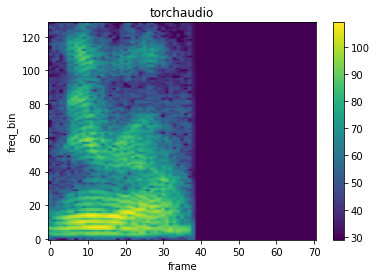

torch.Size([129, 71])


In [8]:
n_fft = 256
win_length = None
hop_length = 128

# define transformation
spects = AV.Spectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
#     center=True,
#     pad_mode="reflect",
#     power=2.0,
)
# Perform transformation
spec = spects(torch.tensor(data1[80],dtype=torch.float32))

# print_stats(spec)
plot_spectrogram(spec, title='torchaudio')
print(spec.shape)

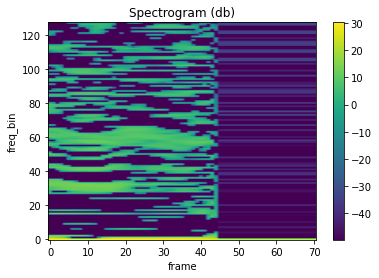

torch.Size([128, 71])


In [9]:
n_fft = 2048
win_length = None
hop_length = 128
n_mels = 128#256
n_mfcc = 128#256

mfcc_transform = AV.MFCC(
    sample_rate=samplerate,
    n_mfcc=n_mfcc, melkwargs={'n_fft': n_fft, 'n_mels': n_mels, 'hop_length': hop_length})

mfcc = mfcc_transform(torch.tensor(data1[80],dtype=torch.float32))

plot_spectrogram(mfcc)
print(mfcc.shape)

In [127]:
64+8

72

In [11]:
n_fft = 256
win_length = None
hop_length = 128

spects = AV.Spectrogram(
    n_fft=n_fft,
    win_length=win_length,
    hop_length=hop_length,
#     center=True,
#     pad_mode="reflect",
#     power=2.0,
)


In [12]:
nf,nt = (128,71)
resize = TV.Resize((nf,nt))

data_spec1 = np.zeros((data1.shape[0],1,nf,nt))
for n in range(data1.shape[0]):
    mfcc = spects(torch.tensor(data1[n],dtype=torch.float32)).numpy() #mfcc_transform
#     mfcc = mfcc_transform(torch.tensor(data1[n],dtype=torch.float32)).numpy() #mfcc_transform
    spec2 = resize(torch.Tensor(mfcc).unsqueeze(0))
    data_spec1[n,:] = librosa.power_to_db(spec2.numpy()) 


In [13]:
from sklearn.model_selection import train_test_split

spec_train, spec_test, labels_train, labels_test = train_test_split(data_spec1, labels_df,train_size=2048, random_state=1)

In [31]:
labels_train.to_csv(os.path.join(rootdir,'labels_train_mfcc.csv'))
labels_test.to_csv(os.path.join(rootdir,'labels_test_mfcc.csv'))

In [32]:
np.save(os.path.join(rootdir,'Specs_mfcc.npy'),data_spec1)
np.save(os.path.join(rootdir,'Specs_train_mfcc.npy'),spec_train)
np.save(os.path.join(rootdir,'Specs_test_mfcc.npy'),spec_test)


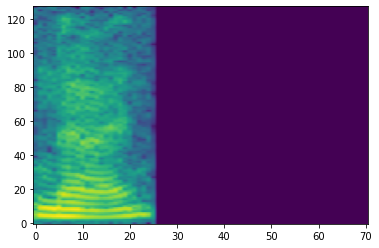

In [17]:
plt.imshow(spec_train[0,0],origin='lower',aspect='auto')

## Sliding window testing

In [16]:
np.lib.stride_tricks.sliding_window_view(spec_train[0,0],window_shape=16,axis=-1)[:,:,:].shape

(128, 56, 16)

In [66]:
a = np.arange(10000).reshape(100,100)

In [26]:
wind_shape = 16
overlap = 8
wind_data = np.lib.stride_tricks.sliding_window_view(spec_train[0,0],window_shape=wind_shape,axis=-1)[:,:,:].transpose(1,0,2).copy()

In [27]:
wind_data.shape,7*16

((56, 128, 16), 112)

In [101]:
np.hstack(wind_data).shape

(128, 120)

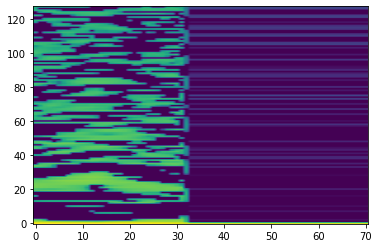

In [28]:
plt.imshow(spec_train[0,0],aspect='auto', origin='lower')

In [43]:
idx = 0
data = spec_train.copy()
wind_size = 16
overlap = 8
sample = np.lib.stride_tricks.sliding_window_view(spec_train[idx,0],window_shape=wind_size,axis=-1)[:,::overlap,:].transpose(1,0,2).copy()
# sample = np.zeros((data.shape[-1]//wind_size,data.shape[-2],wind_size))
# for n in range(data.shape[-1]//wind_size):
#     sample[n] = data[idx,:,:,(n*wind_size):(n*wind_size+wind_size)]

sample = (sample - np.min(sample))/(np.max(sample)-np.min(sample))
sample = np.clip(sample, 2e-30, 1).astype(np.float32)

In [44]:
sample.shape

(7, 128, 16)

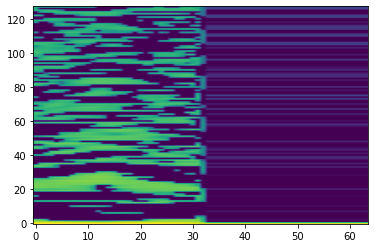

In [41]:
# plt.figure(figsize=(20,10))
plt.imshow(np.hstack(sample),aspect='auto', origin='lower')